In [2]:
import torch
import torchvision
from torchvision import transforms as T

from PIL import Image
import cv2
from google.colab.patches import cv2_imshow

**import torch:** This line imports the PyTorch library, which is a widely-used deep learning framework for developing and training machine learning models.

**import torchvision:** This line imports the torchvision library, which is a collection of pre-trained models and datasets for computer vision tasks.

**from torchvision import transforms as T**: This line imports the transforms module from the torchvision library and renames it as T. The transforms module provides a set of common image transformation functions that can be applied to images during data preprocessing.

**from PIL import Image:** This line imports the Image module from the Python Imaging Library (PIL), which is a widely-used library for processing images.

**import cv2: **This line imports the OpenCV (Computer Vision) library, which is a popular library for real-time computer vision and image processing tasks.

**from google.colab.patches import cv2_imshow:** This line imports the cv2_imshow function from the google.colab.patches module. This function is specifically used in the Google Colab environment (a cloud-based Jupyter Notebook) to display images processed using OpenCV.

In [3]:
model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights = "DEFAULT")


Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:01<00:00, 90.8MB/s]


The line model = torchvision.models.detection.maskrcnn_resnet50_fpn(weights="DEFAULT") is loading a pre-trained Mask R-CNN model from the torchvision.models.detection module in PyTorch.

**Let's break down the different parts of this line:**

**torchvision.models.detection:** This is a submodule of the torchvision library that provides pre-trained models for various object detection and instance segmentation tasks.

**maskrcnn_resnet50_fpn:** This is the specific model being loaded. Mask R-CNN is a deep learning model that performs both object detection and instance segmentation.

**weights**="DEFAULT": This parameter specifies that we want to load the default pre-trained weights for the Mask R-CNN model.

In [4]:
model.eval()

MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

**model.eval()** puts the model in evaluation mode, which disables certain training-specific behaviors for more stable and consistent predictions.

In [40]:
img = Image.open("/content/drive/MyDrive/demo_images/pexels-olly-937668.jpg")

This line of code uses the Image module from the Python Imaging Library (PIL) to open an image file located at the specified path, /content/drive/MyDrive/demo_images/pexels-olly-937668.jpg. The opened image is then stored in the variable img.

In [41]:
transform = T.ToTensor()
ig = transform(img)


The first line creates a **ToTensor** transformation from the **torchvision.transforms** module. The second line applies this transformation to the **img **variable, converting it to a PyTorch tensor **ig**.

In [42]:
with torch.no_grad():
  pred = model([ig])

The with **torch.no_grad()**: block disables gradient computation, and then the **pred = model([ig])** line passes the tensor **ig** through the model to get the model's prediction,** pred**.

In [43]:
pred[0].keys()

dict_keys(['boxes', 'labels', 'scores', 'masks'])

This line of code accesses the keys (or attributes) of the first element in the **pred** output, which is a dictionary containing the model's predictions.

In [44]:
pred[0]["labels"] , pred[0]["scores"] , pred[0]["labels"].shape


(tensor([ 8,  5,  1, 16]),
 tensor([0.9921, 0.1148, 0.0982, 0.0544]),
 torch.Size([4]))

**pred[0]["labels"]** retrieves the predicted labels from the model's
output.
**pred[0]["scores"]** retrieves the confidence scores for the predicted
labels.
**pred[0]["labels"].shape** returns the shape of the predicted labels
tensor.

In [45]:
masks = pred[0]["masks"]

This line retrieves the predicted instance segmentation masks from the model's output, which are stored in the **masks** variable.

In [46]:
masks.shape

torch.Size([4, 1, 3744, 5616])

This line returns the shape of the **masks** tensor, which represents the dimensions of the predicted instance segmentation masks.

In [47]:
mask = masks[0 , 0]

This line extracts the first **mask** (index 0) from the first batch element (index 0) of the masks tensor, and stores it in the mask variable.

In [48]:
mask.unique()

tensor([0.0000e+00, 2.0498e-08, 2.0675e-08,  ..., 9.9985e-01, 9.9985e-01,
        9.9985e-01])

This line returns a tensor containing the unique values present in the **mask** tensor, which can be useful for understanding the contents of the mask.

In [49]:
mask = masks[0 , 0] > 0.5


This line applies an element-wise boolean comparison to the first mask (index 0) from the first batch element (index 0) of the **masks** tensor, where values greater than 0.5 are considered **True**, and the result is stored in the mask variable.

In [50]:
mask.unique()

tensor([False,  True])

This line returns a tensor containing the unique values present in the boolean **mask** tensor, which can be useful for understanding the contents of the mask after the thresholding operation.

In [51]:
vehicle_mask = mask.numpy().astype("uint8") * 255

This line converts the boolean **mask **tensor to a numpy array, casts it to an unsigned 8-bit integer (uint8) data type, and multiplies it by 255 to create a grayscale image representation of the **vehicle mask**, which is then stored in the vehicle_mask variable.

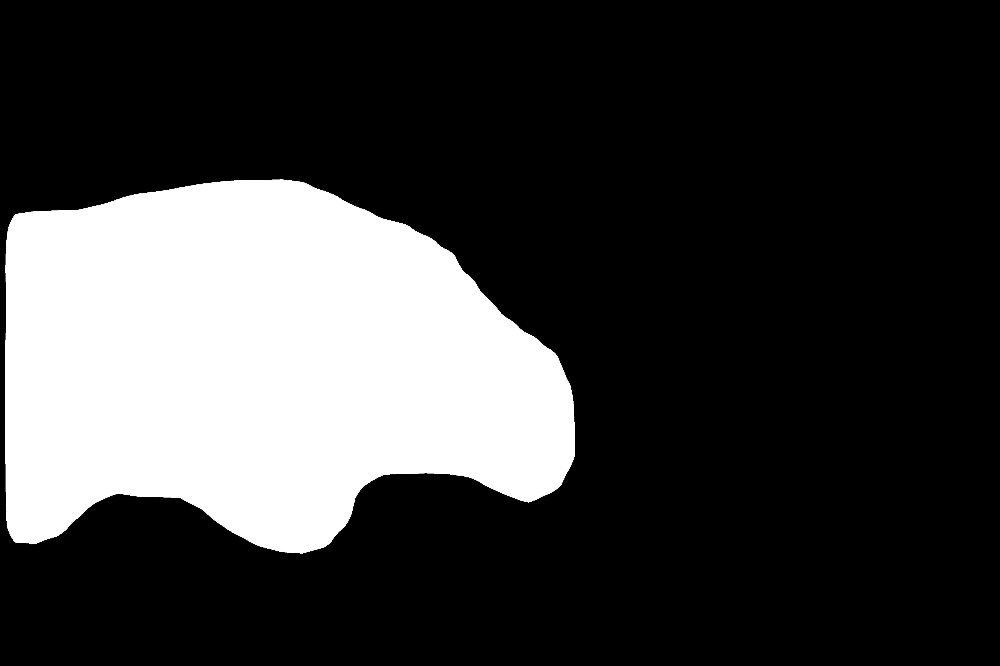

In [52]:
cv2_imshow(vehicle_mask)

This line uses the **cv2_imshow()** function from the **google.colab.patches** module to display the **vehicle_mask** image in the Google Colab environment.

In [53]:
igg = cv2.imread("/content/drive/MyDrive/demo_images/pexels-olly-937668.jpg")

This line uses the **cv2.imread()** function from the OpenCV library to load an image from the specified file path,** /content/drive/MyDrive/demo_images/pexels-olly-937668.jpg**, and stores the image data in the **igg** variable.

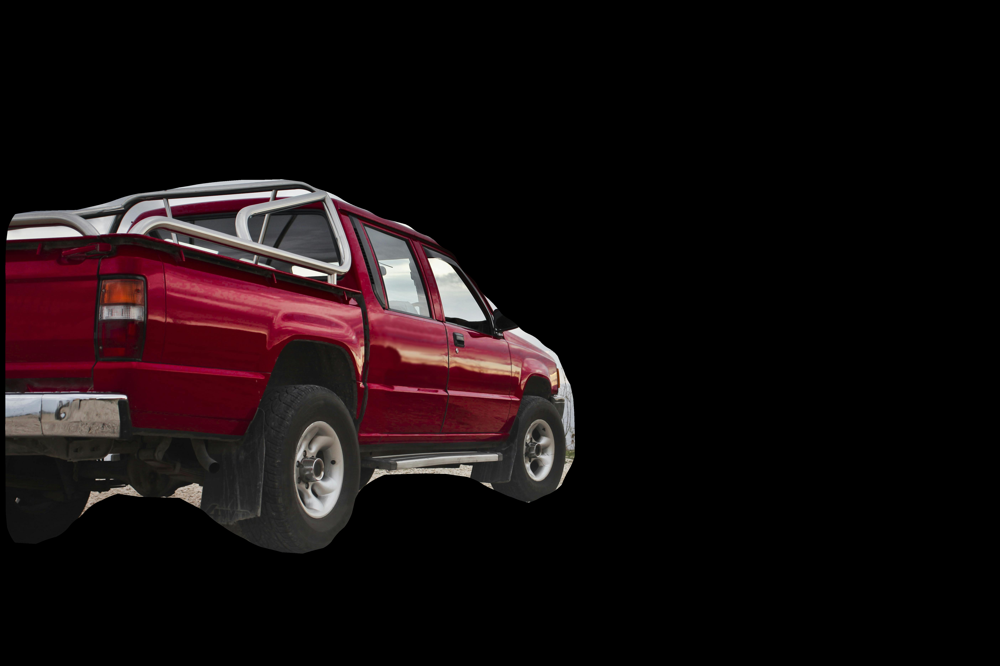

In [54]:
fin_img = cv2.bitwise_and(igg , igg , mask = vehicle_mask)
cv2_imshow(fin_img)

The first line performs a bitwise AND operation between the original image **igg **and itself, using the **vehicle_mask** as the mask. This effectively applies the vehicle mask to the original image, resulting in the **fin_img variable.**
The second line uses the **cv2_imshow()** function to display the resulting **fin_img** in the Google Colab environment.

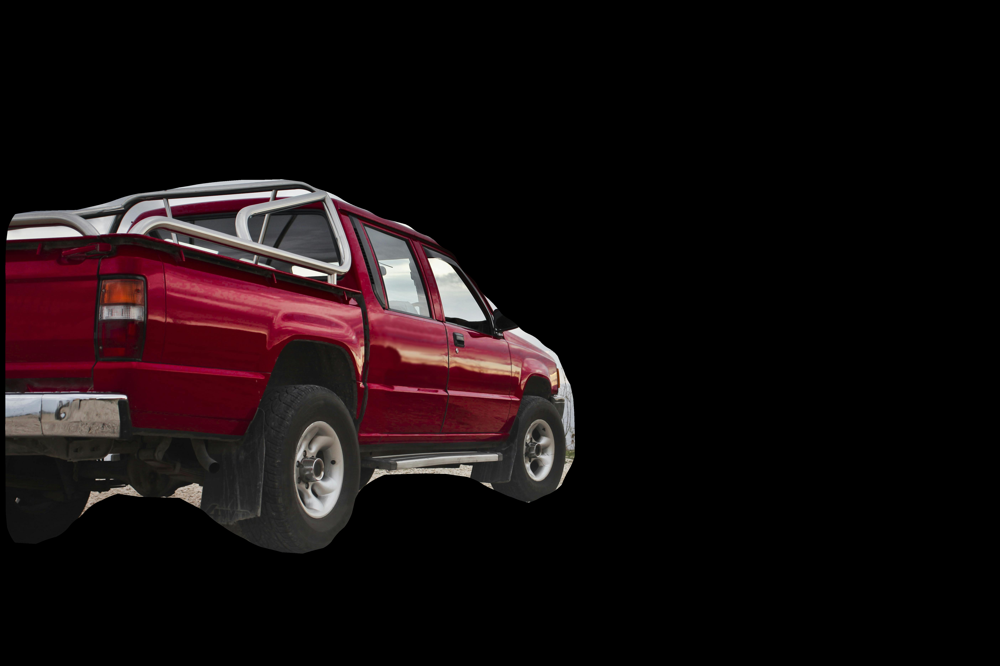

In [55]:
vehicle_mask = cv2.resize(vehicle_mask, (igg.shape[1], igg.shape[0])).astype("uint8")
fin_img = cv2.bitwise_and(igg, igg, mask=vehicle_mask)
cv2_imshow(fin_img)

The first line resizes the **vehicle_mask** to match the dimensions of the original image **igg**, and then casts the resulting mask to an unsigned 8-bit integer (uint8) data type.

The second line performs a bitwise AND operation between the original image **igg** and itself, using the resized **vehicle_mask** as the mask. This applies the vehicle mask to the original image, resulting in the **fin_img** variable.

The third line uses the **cv2_imshow()** function to display the resulting **fin_img** in the Google Colab environment.